In [75]:
import numpy as np
import pandas as pd
from time import time
from sklearn import metrics
from collections import defaultdict
import matplotlib.pyplot as plt
import glob
import seaborn as sns


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics.cluster import contingency_matrix, homogeneity_score, completeness_score, adjusted_rand_score, adjusted_mutual_info_score, v_measure_score
from sklearn.metrics.cluster import contingency_matrix

## profiling
from pandas_profiling import ProfileReport
%matplotlib inline

## Diamond Dataset

In [221]:
#diamond
diamond_df = pd.read_csv('diamonds.csv')

In [227]:
diamond_df = diamond_df.drop(["Unnamed: 0"], axis=1)


In [ ]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
diamond_labels = diamond_df.copy()
s = (diamond_labels.dtypes =="object")
object_cols = list(s[s].index)
label_encoder = LabelEncoder()
for col in object_cols:
    diamond_labels[col] = label_encoder.fit_transform(diamond_labels[col])
diamond_labels.head()

In [229]:
feature_columns_diamond = list(diamond_labels.columns)

In [230]:
def prepare_data(all_data,selected_features,label_data):
    if all_data == True:
        X = label_data.drop(["price"],axis =1)
    else:
        X = label_data[selected_features]
    y = label_data['price']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)
    return X_train,X_val,X_test,y_train,y_val,y_test

In [232]:
selected_features = ['carat','x','y','z']
all_features = ['carat','x','y','z','clarity','color','cut','depth','table']
X_train,X_val,X_test,y_train,y_val,y_test = prepare_data(True,selected_features,diamond_labels)
X_train_sel,X_val_sel,X_test_sel,y_train_sel,y_val_sel,y_test_sel = prepare_data(False,selected_features,diamond_labels)

In [234]:
sc=preprocessing.StandardScaler()

X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

## Gas Turbine CO and NOx Emission Data Set

In [76]:
path = 'pp_gas_emission/'
all_files = glob.glob(path + "/*.csv")
li = []
years = []
for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    df['year'] = int(filename[-8:-4])
    years.append(int(int(filename[-8:-4])))
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)

### predict the criteria pollutants in a particular region - CO

### Standardize feature columns 

In [77]:
frame.drop('NOX',axis =1,inplace=True)

### One hot encode the year column (doesn't work for profiler) [Categorical Data]

In [78]:
one_hot = pd.get_dummies(frame['year'])
frame_catdata = frame.drop('year',axis=1)
frame_catdata = frame.join(one_hot)

In [79]:
frame['year_cat'] =  frame['year'].astype('category')

In [252]:
def standardize_dataset(full_df,num_feature_columns =num_feature_columns):
    scaler = preprocessing.StandardScaler()
    full_df_stand = full_df.copy(deep=True)
    full_df_stand[num_feature_columns] = scaler.fit_transform(full_df_stand[num_feature_columns])
    return full_df_stand

### Set the feature columns

In [118]:
profile_columns = list(set(frame.columns) - set(['NOX','year_cat','year']))

In [262]:
feature_columns = list(frame.columns)
feature_columns = list(set(feature_columns) - set(['NOX','CO','year']))
num_feature_columns = list(set(feature_columns)-set(['year_cat']))
num_feature_and_he_columns = list(set(frame_catdata.columns)- set(['NOX','CO','year']))
num_feature_and_cat_columns = list(set(frame.columns)- set(['NOX','CO','year']))
num_feature_and_year_columns = list(set(frame.columns)- set(['NOX','CO','year_cat']))

In [120]:
profile = ProfileReport(frame[profile_columns], title="frame Profiling Report",explorative=True)

In [239]:
def split_frame(df, feature_columns,target):
    frame_train, frame_test, co_train, co_test = train_test_split(df[feature_columns], df[target], test_size=0.2, random_state=42)
    return frame_train, frame_test, co_train, co_test

## Profile

In [122]:
profile.to_file("gas_report.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 59.70it/s]


In [121]:
profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.49s/it]


## Q4 Construct and inspect the box plot of categorical features vs target variable. What do you find?

In [45]:
def box_plot(feature,target,df_data):
    fig, ax1  = plt.subplots(figsize=(7, 5))

    #feature = 'carat'
    #target = 'price'
    title_name = str(feature) + ' vs ' + target

    props = dict(widths=0.8,patch_artist=True, medianprops=dict(color="gold"))
    box1=ax1.boxplot(df_data[feature], positions=[0], **props)

    ax2 = ax1.twinx()
    box2=ax2.boxplot(df_data[target],positions=[1], **props)

    # ax1.set_xticks(range(len(df.columns)))
    # ax1.set_xticklabels(df.columns)

    for b in box1["boxes"]+box2["boxes"]:
        b.set_facecolor(next(ax1._get_lines.prop_cycler)["color"])
    plt.title(title_name)
    plt.show()

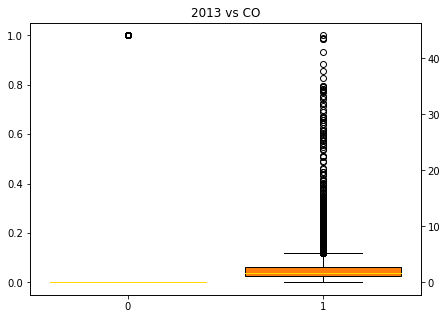

In [185]:
# for feature in num_feature_columns:
box_plot(2013,'CO',frame_catdata)

## Standardizing columns

In [82]:
frame_standardized = standardize_dataset(frame)

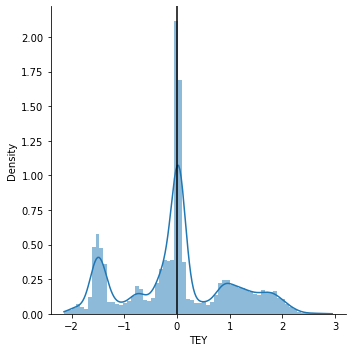

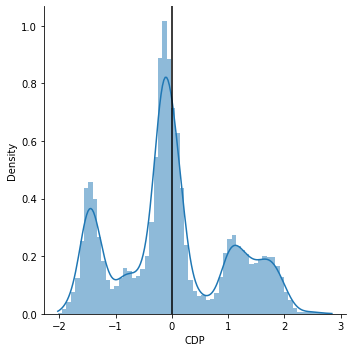

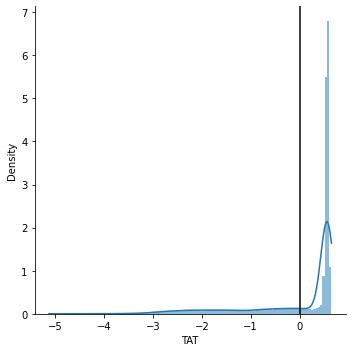

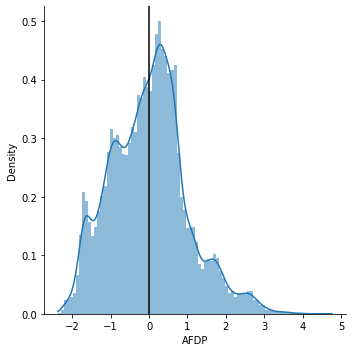

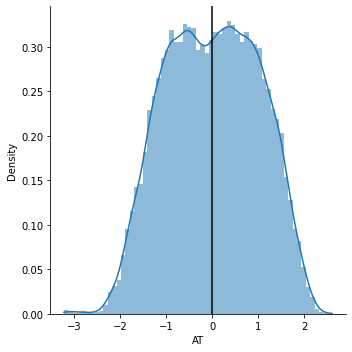

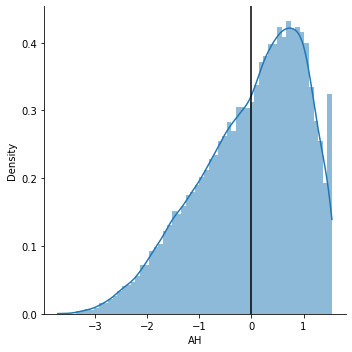

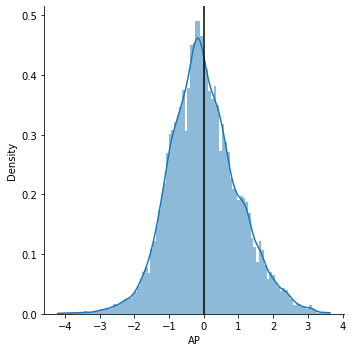

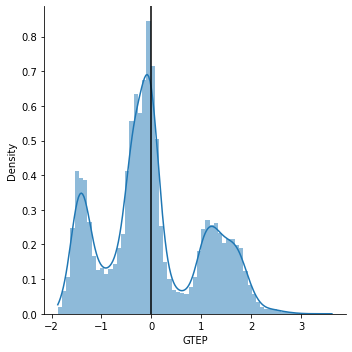

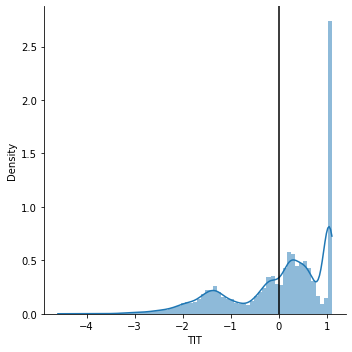

In [26]:
# Distribution Plots with standardized columns
num = frame_standardized.select_dtypes(include=np.number)  # Get numeric columns
n = num.shape[1]  # Number of cols
for  col in  num:  # For each column...
    sns.displot(num[col],kde=True, stat="density", linewidth=0)   # Plot histogaerm
    plt.axvline(num[col].mean(), c='k')  # Plot mean

## Q3 Plot the histogram of numerical features. What preprocessing can be done if the distribution of a feature has high skewness?
 Tackling Skewness (nothing works :/)

In [11]:
def plot_column(column):
    sns.displot(column,kde=True, stat="density", linewidth=0)   # Plot histogaerm
    plt.axvline(column.mean(), c='k')

In [123]:
frame_standardized.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'year', 'year_cat'],
      dtype='object')

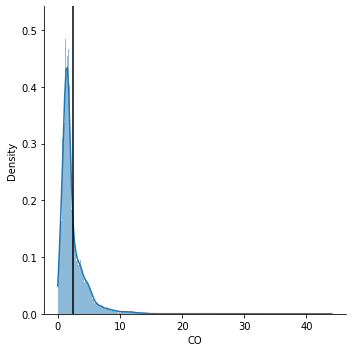

In [134]:
plot_column(frame_standardized['CO'])

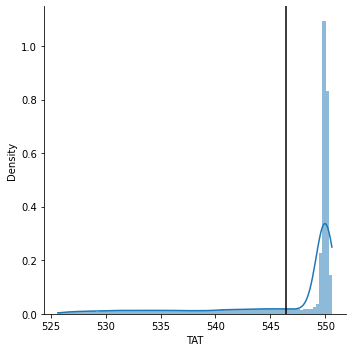

In [23]:
## take only datapoints that lie within 3 std of the mean 
from scipy import stats
std_dev = 3
plot_column(frame['TAT'][(np.abs(stats.zscore(frame['TAT'])) < float(std_dev))])

## Q6 Yearly trends
plot the yearly trends for each feature and compare
them.

In [156]:
def plot_timeseries(column_name):
    ax = frame.loc[frame['year']==2013][column_name].plot(figsize=(15,15))
    for year in years:
        frame.loc[frame['year']==year].reset_index()[column_name].plot(figsize=(10,10),ax =ax)
    ax.legend(years)
    ax.set_xlabel('Time')
    ax.set_ylabel(column_name)
    return 

### run per column for all timeseries plots

In [229]:
num_feature_columns

['AH', 'AT', 'AFDP', 'TIT', 'TEY', 'AP', 'CDP', 'TAT', 'GTEP']

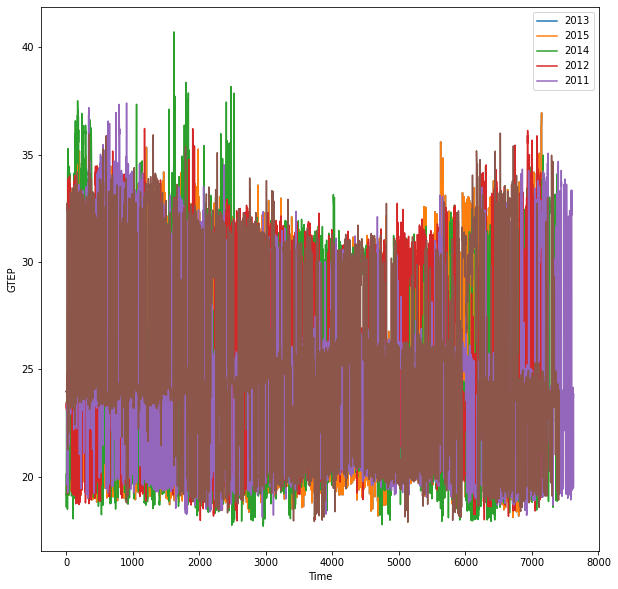

In [157]:
plot_timeseries('GTEP')

## Q7 Feature Selection 

In [171]:
from sklearn.feature_selection import mutual_info_regression 
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import RepeatedKFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectPercentile

In [84]:
def tonparray(df,feature_columns,target):
    X = df[feature_columns].values
    y = df[target].values
    return X, y

In [168]:
# df_mi = pd.DataFrame(mi_reg( frame['CO'],frame[num_feature_columns]), index = num_feature_columns).apply(lambda x: x / x.max(), axis = 1)

def select_features(df,feature_columns,target,num_of_features='all'):
    train, test = train_test_split(df, test_size=0.2)

    X_train = train[feature_columns].values
    y_train = train[target].values
    X_test = test[feature_columns].values
    y_test = test[target].values

    fs = SelectKBest(score_func=mutual_info_regression, k=num_of_features)
    fs.fit(X_train,y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)

    inc_nuinfo_features_num = [feature_columns[i] for i in np.argsort(fs.scores_)]
    scores_dict = dict(zip(feature_columns,fs.scores_))
    return inc_nuinfo_features_num,scores_dict

In [166]:
inc_freg_features_num,freg_scores_dict = select_features(frame_standardized,num_feature_and_cat_columns,'CO')

In [310]:
freg_scores_dict

{'AP': 117.51217819901785,
 'AFDP': 7406.310582666729,
 'TAT': 99.10016475715045,
 'TEY': 14245.949530891332,
 'CDP': 12870.756375818139,
 'AT': 893.8118524900199,
 'AH': 347.1415585725693,
 'year_cat': 939.3838843381982,
 'TIT': 29505.644616588415,
 'GTEP': 10913.815734830492}

In [309]:
inc_freg_features_num

['TAT', 'AP', 'AH', 'AT', 'year_cat', 'AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

In [169]:
inc_nuinfo_features_num ,muscores_dict= select_features(frame_standardized,num_feature_and_cat_columns,'CO')

In [311]:
inc_nuinfo_features_num

['AH', 'AP', 'AT', 'year_cat', 'TAT', 'AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

In [170]:
muscores_dict

{'AP': 0.04095494317444803,
 'AFDP': 0.2693061622682835,
 'TAT': 0.15933122954589773,
 'TEY': 0.48990696785211796,
 'CDP': 0.4682207298466796,
 'AT': 0.10476130494777713,
 'AH': 0.020637246128658582,
 'year_cat': 0.12716258951378245,
 'TIT': 0.5350599672640852,
 'GTEP': 0.4407785546999934}

Choosing the top 5 features 

In [313]:
num_feature_columns_top5 = inc_nuinfo_features_num[-5:]

In [322]:
num_feature_columns_top5

['AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

In [51]:
def compute_rmse_for_features(feature_columns,full_df, standardize =False):
    if standardize is True: 
        df = standardize_dataset(full_df)   
    else:
        df = full_df


    X = df[feature_columns].values
    y = df['CO'].values
    
    regression = LinearRegression()
    scoring_para = 'neg_root_mean_squared_error'
    scores = cross_val_score(regression, X, y,cv =10, scoring=scoring_para)
    return scores.mean()


In [52]:
inc_nuinfo_features_num

['AH', 'AP', 'AT', 'year_cat', 'TAT', 'AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

selector = feature_selection.SelectPercentile(feature_selection.f_regression, percentile=30)
selector.fit(X_train, y_train)
selector.get_support(True)

In [169]:
num_features=[]
for i in range(1,len(inc_nuinfo_features_num)+1):
    num_features.append(compute_rmse_for_features(inc_nuinfo_features_num[-i:],frame,standardize=True))
print(np.argmax(num_features))

2


In [172]:
num_features=[]
for i in range(1,len(inc_freg_features_num)+1):
    num_features.append(compute_rmse_for_features(inc_nuinfo_features_num[-i:],frame,standardize=True))
print(np.argmax(num_features))

7


In [ ]:
dict(zip(num_feature_columns,fs.scores_))

{'TEY': 0.49561789002498546,
 'CDP': 0.47229834963763917,
 'TAT': 0.15799763070411998,
 'AFDP': 0.27839019334468684,
 'AT': 0.10793645701283694,
 'AH': 0.022187799028607458,
 'AP': 0.045358869959645,
 'GTEP': 0.44714891679077784,
 'TIT': 0.5358247408137897}

### Gridsearch number of features value for standardized and non_standardized dataframe (numerical features)
Standardizing numerical features or not, the number of features considered important, using the Mutual Information Score to rank them, and pick the ones with the highest score, yielded a lowest RMSE error when all the 9 features are considered at once

In [ ]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.492
Best Config: {'sel__k': 9}
>-1.598 with: {'sel__k': 1}
>-1.548 with: {'sel__k': 2}
>-1.512 with: {'sel__k': 3}
>-1.512 with: {'sel__k': 4}
>-1.511 with: {'sel__k': 5}
>-1.499 with: {'sel__k': 6}
>-1.495 with: {'sel__k': 7}
>-1.495 with: {'sel__k': 8}
>-1.492 with: {'sel__k': 9}


In [ ]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_standardized_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.490
Best Config: {'sel__k': 9}
>-1.596 with: {'sel__k': 1}
>-1.546 with: {'sel__k': 2}
>-1.510 with: {'sel__k': 3}
>-1.510 with: {'sel__k': 4}
>-1.509 with: {'sel__k': 5}
>-1.497 with: {'sel__k': 6}
>-1.493 with: {'sel__k': 7}
>-1.493 with: {'sel__k': 8}
>-1.490 with: {'sel__k': 9}


In [45]:
dict(zip(num_feature_columns,fs.scores_))

{'TEY': 0.49561789002498546,
 'CDP': 0.47229834963763917,
 'TAT': 0.15799763070411998,
 'AFDP': 0.27839019334468684,
 'AT': 0.10793645701283694,
 'AH': 0.022187799028607458,
 'AP': 0.045358869959645,
 'GTEP': 0.44714891679077784,
 'TIT': 0.5358247408137897}

In [101]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.492
Best Config: {'sel__k': 9}
>-1.598 with: {'sel__k': 1}
>-1.548 with: {'sel__k': 2}
>-1.512 with: {'sel__k': 3}
>-1.512 with: {'sel__k': 4}
>-1.511 with: {'sel__k': 5}
>-1.499 with: {'sel__k': 6}
>-1.495 with: {'sel__k': 7}
>-1.495 with: {'sel__k': 8}
>-1.492 with: {'sel__k': 9}


In [104]:
cv = RepeatedKFold(n_splits=10, n_repeats=3)
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])

grid = dict()
grid['sel__k'] = [i for i in range(1,10)]
search = GridSearchCV(pipeline, grid, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv)
results = search.fit(X_num_standardized_full, y_num_full)
# summarize best

print('Best RMSE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best RMSE: -1.490
Best Config: {'sel__k': 9}
>-1.596 with: {'sel__k': 1}
>-1.546 with: {'sel__k': 2}
>-1.510 with: {'sel__k': 3}
>-1.510 with: {'sel__k': 4}
>-1.509 with: {'sel__k': 5}
>-1.497 with: {'sel__k': 6}
>-1.493 with: {'sel__k': 7}
>-1.493 with: {'sel__k': 8}
>-1.490 with: {'sel__k': 9}


## Linear Regression

In [87]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter("ignore", category=ConvergenceWarning)

In [88]:
import statsmodels.api as sm
from scipy import stats

In [29]:
frame_standardized_he = standardize_dataset(frame_catdata) #hotnecoded

In [320]:
X_pval = frame_catdata[num_feature_and_he_columns]
y_pval = frame_catdata['CO']

In [321]:
X2 = sm.add_constant(X_pval)
est = sm.OLS(y_pval, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                     CO   R-squared:                       0.599
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     4218.
Date:                Thu, 17 Mar 2022   Prob (F-statistic):               0.00
Time:                        13:41:14   Log-Likelihood:                -65334.
No. Observations:               36733   AIC:                         1.307e+05
Df Residuals:                   36719   BIC:                         1.308e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        101.3529      1.821     55.666      0.0

In [318]:
X2dia = sm.add_constant(X_train)
estdia = sm.OLS(y_train, X2dia)
estdia2 = estdia.fit()
print(estdia2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                 2.918e+04
Date:                Thu, 17 Mar 2022   Prob (F-statistic):               0.00
Time:                        13:40:33   Log-Likelihood:            -2.9810e+05
No. Observations:               34521   AIC:                         5.962e+05
Df Residuals:                   34511   BIC:                         5.963e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.604e+04    507.102     31.626      0.0

## Splitting Data- Full

In [268]:
frame_train, frame_test, co_train, co_test = split_frame(frame, num_feature_columns,'CO')

In [272]:
frame_train_sc = standardize_dataset(frame_train,num_feature_columns)

In [253]:
dia_train, dia_test, price_train, price_test = split_frame(diamond_labels, selected_features,'price')
dia_train_sc = standardize_dataset(dia_train,selected_features)

## Splitting Data Top 5

In [323]:
num_feature_columns_top5

['AFDP', 'GTEP', 'CDP', 'TEY', 'TIT']

In [314]:
frame_train5, frame_test5, co_train5, co_test5 = split_frame(frame, num_feature_columns_top5,'CO')

In [315]:
frame_train5_sc = standardize_dataset(frame_train5,num_feature_columns_top5)
frame_test5_sc = standardize_dataset(frame_test5,num_feature_columns_top5)

## Choosing regularization Parameter for Ridge and Lasso regressions

In [274]:
def eval_models_regularization(df,feature_columns,target):
    X = df[feature_columns].values
    # y = df[target].values
    y =target
    for Model in [Ridge, Lasso]:
        model = Model()
        print('Default params Error Value %s: %s' % (Model.__name__,
                        np.absolute(cross_val_score(model, X, y,scoring='neg_root_mean_squared_error')).mean()))

    alphas = np.logspace(-6, 1, 30)
   

    plt.figure(figsize=(5, 3))

    for Model in [Lasso, Ridge]:
        scores = [np.absolute(cross_val_score(Model(alpha), X, y, cv=10,scoring='neg_root_mean_squared_error')).mean()
                for alpha in alphas]
        print("Optimal Alpha {} for Model {} ".format(alphas[np.argmin(scores)],Model.__name__))
        
        plt.plot(alphas, scores, label=Model.__name__)

    plt.legend(loc='lower right')
    plt.xlabel('alpha')
    plt.ylabel('cross validation score')
    plt.tight_layout()
    plt.show()

Default params Error Value Ridge: 1.4843359230958026
Default params Error Value Lasso: 1.8771980751569202
Optimal Alpha 1.610262027560939e-05 for Model Lasso 
Optimal Alpha 0.6210169418915616 for Model Ridge 


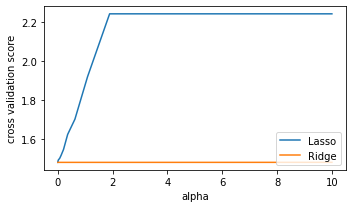

In [275]:
# numerical features
eval_models_regularization(frame_train_sc,num_feature_columns,co_train)

Default params Error Value Ridge: 1.4843345206888285
Default params Error Value Lasso: 1.513385173946013
Optimal Alpha 5.298316906283713e-06 for Model Lasso 
Optimal Alpha 1.8873918221350996 for Model Ridge 


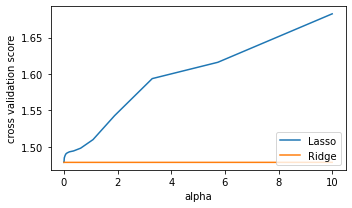

In [276]:
eval_models_regularization(frame_train,num_feature_columns,co_train)

### Diamond Dataset 

Default params Error Value Ridge: 1532.0307829800824
Default params Error Value Lasso: 1530.718967315873
Optimal Alpha 3.2903445623126713 for Model Lasso 
Optimal Alpha 10.0 for Model Ridge 


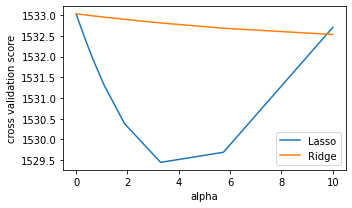

In [278]:
eval_models_regularization(dia_train,selected_features,price_train)

Default params Error Value Ridge: 1532.0683366250614
Default params Error Value Lasso: 1530.86146696395
Optimal Alpha 5.736152510448681 for Model Lasso 
Optimal Alpha 10.0 for Model Ridge 


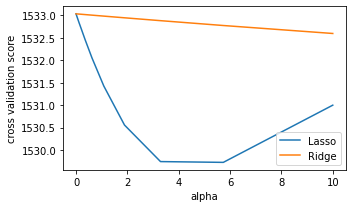

In [279]:
eval_models_regularization(dia_train_sc,selected_features,price_train)

### Q9 Report your choice of the best regularization scheme along with the optimal penalty parameter and briefly explain how it can be computed
GridSearch across Lasso and ridge with alpha values for a given number of features selected for standardized and unstandardized data

In [280]:
optimal_lasso_gas = Lasso(1.610262027560939e-05)
optimal_ridge_gas = Ridge(0.6210169418915616)
optimal_lasso_dia = Lasso(5.736152510448681)
optimal_ridge_dia = Ridge(10)

In [283]:

get_training_val_rmse_errors(dia_train_sc,selected_features,price_train,optimal_lasso_dia,"Lasso-Diamond")
get_training_val_rmse_errors(dia_train_sc,selected_features,price_train,optimal_ridge_dia,"Ridge-Diamond")
get_training_val_rmse_errors(frame_train_sc,num_feature_columns,co_train,optimal_lasso_gas,"Lasso-Gas")
get_training_val_rmse_errors(frame_train_sc,num_feature_columns,co_train,optimal_ridge_gas,"Ridge-Diamond")

RMSE Training Error 1525.7348205972999 Validation Error 1529.727117096412 for optimal values for Lasso-Diamond
RMSE Training Error 1524.3926944486802 Validation Error 1532.5971935662433 for optimal values for Ridge-Diamond
RMSE Training Error 1.4852477550650884 Validation Error 1.4787168427467685 for optimal values for Lasso-Gas
RMSE Training Error 1.4852478970984344 Validation Error 1.4787164031613413 for optimal values for Ridge-Diamond


(1.4852478970984344, 1.4787164031613413)

In [282]:

def get_training_val_rmse_errors(df,feature_columns,target,model,heading):

    X = df[feature_columns].values
    y = target #df[target].values
    cve=cross_validate(model,X,y,scoring='neg_root_mean_squared_error',cv=10,return_train_score=True)
    training_error = np.mean(np.absolute(cve['train_score']))
    cross_validation_error = np.mean(np.absolute(cve['test_score']))
    print("RMSE Training Error {} Validation Error {} for optimal values for {}".format(training_error,cross_validation_error,heading))
    return training_error , cross_validation_error

In [288]:
frame_test_sc = standardize_dataset(frame_test,num_feature_columns)
dia_test_sc = standardize_dataset(dia_test,selected_features)

In [290]:
def performance_eval(model,model_name,X_test,y_test,X_train,y_train):
    # Model prediction on test data
    model.fit(X_train,y_train)
    pred = model.predict(X_test)
    print('Performance of ' + model_name)
    print("R^2:",metrics.r2_score(y_test, pred))
    print("Adjusted R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
    print("MAE:",metrics.mean_absolute_error(y_test, pred))
    print("MSE:",metrics.mean_squared_error(y_test, pred))
    print("RMSE:",metrics.mean_squared_error(y_test, pred,squared=False))
    print('-' * 30)

In [292]:
performance_eval(optimal_lasso_gas,"Lasso-Gas",frame_test_sc,co_test,frame_train_sc,co_train)
performance_eval(optimal_ridge_dia,"Ridge-Dia",dia_test_sc,price_test,dia_train_sc,price_train)

Performance of Lasso-Gas
R^2: 0.5675140157489011
Adjusted R^2: 0.5669835027520005
MAE: 0.8589892185872183
MSE: 2.35272675818677
RMSE: 1.5338600842928178
------------------------------
Performance of Ridge-Dia
R^2: 0.854330133453127
Adjusted R^2: 0.8542760965926812
MAE: 905.1840377566392
MSE: 2315688.103821926
RMSE: 1521.7385136158991
------------------------------


In [295]:
performance_eval(lr,"OLS-Gas",frame_test_sc,co_test,frame_train_sc,co_train)
performance_eval(lr,"OLS-Dia",dia_test_sc,price_test,dia_train_sc,price_train)

Performance of OLS-Gas
R^2: 0.5675192581461345
Adjusted R^2: 0.5669887515798697
MAE: 0.8590459584585518
MSE: 2.3526982395094094
RMSE: 1.5338507878895553
------------------------------
Performance of OLS-Dia
R^2: 0.8543484065734648
Adjusted R^2: 0.8542943764915112
MAE: 903.607758155289
MSE: 2315397.619259889
RMSE: 1521.6430656562954
------------------------------


In [294]:
lr =LinearRegression()

## Polynomial Regression

In [89]:
from sklearn.preprocessing import PolynomialFeatures

### Q12 Salient Features 

In [56]:
poly_regression(3,frame_standardized,'CO',inc_nuinfo_features_num[-3:])

{'fit_time': array([0.01399755, 0.03168106, 0.04633975, 0.03381944, 0.03775311]),
 'score_time': array([0.00909305, 0.00326896, 0.0059309 , 0.00523806, 0.00322223]),
 'test_score': array([-1.4591755 , -1.64282886, -1.66864175, -1.36664601, -1.52617286]),
 'train_score': array([-1.3444097 , -1.30350825, -1.32499698, -1.36038985, -1.34233718])}

In [297]:
def poly_regression(degree,df,target_column,feature_columns):
    y = target_column
    x_poly_train=PolynomialFeatures(degree=degree).fit_transform(df[feature_columns])
    lr=LinearRegression(fit_intercept=False)
    cve=cross_validate(lr,x_poly_train,y,scoring='neg_root_mean_squared_error',cv=5,return_train_score=True)
    return cve


### Q13 What degree of polynomial is best?

In [305]:
def choose_poly_degree(df,target_column,feature_columns):
    maxdegree=5
    cross_validation_error=[]
    training_error = []
    for deg in range(1,maxdegree):
        cve = poly_regression(deg,df,target_column,feature_columns)
        trerr = np.mean(np.absolute(cve['train_score']))
        training_error.append(trerr)
        verr = np.mean(np.absolute(cve['test_score']))
        cross_validation_error.append(verr)
        print(" Degree:{} Training Error {} Validation Error {} ".format(deg,trerr,verr))    
    return cross_validation_error, training_error

In [330]:
def plot_error_vs_degree(maxdegree,error_list, error_name):
    fig,ax=plt.subplots(figsize=(6,6))
    ax.plot(range(1,maxdegree),error_list)
    ax.set_xlabel('Degree',fontsize=15)
    ax.set_ylabel('RMSE',fontsize=15)
    ax.set_title('RMSE VS Degree {}'.format(error_name),fontsize=20)

In [306]:
trerr,valerr = choose_poly_degree(frame_train_sc,co_train,num_feature_columns) #full dataset

 Degree:1 Training Error 1.4851878197606792 Validation Error 1.4843342627980205 
 Degree:2 Training Error 1.243824194505373 Validation Error 1.2569351484699893 
 Degree:3 Training Error 1.125179930906822 Validation Error 1.1976663582717726 
 Degree:4 Training Error 0.9922570229701678 Validation Error 1.2413339270900605 


In [334]:
trerr,valerr = choose_poly_degree(frame_train5_sc,co_train5,num_feature_columns_top5) #top5 features 

 Degree:1 Training Error 1.5042057622631044 Validation Error 1.5032220166013606 
 Degree:2 Training Error 1.3470919881105536 Validation Error 1.351170298382743 
 Degree:3 Training Error 1.3018495046632648 Validation Error 1.3388166623732765 
 Degree:4 Training Error 1.2248971789201553 Validation Error 1.340002066980957 


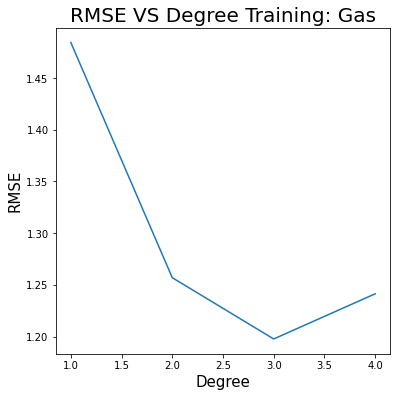

In [332]:
plot_error_vs_degree(5,trerr,"Training: Gas")

In [111]:
def PolynomialFeatures_labeled(input_df,input_feature_names,target,power):
    '''Basically this is a cover for the sklearn preprocessing function. 
    The problem with that function is if you give it a labeled dataframe, it ouputs an unlabeled dataframe with potentially
    a whole bunch of unlabeled columns. 
    Inputs:
    input_df = Your labeled pandas dataframe (list of x's not raised to any power) 
    power = what order polynomial you want variables up to. (use the same power as you want entered into pp.PolynomialFeatures(power) directly)
    Ouput:
    Output: This function relies on the powers_ matrix which is one of the preprocessing function's outputs to create logical labels and 
    outputs a labeled pandas dataframe   
    '''
    poly = PolynomialFeatures(power)
    output_nparray = poly.fit_transform(input_df[input_feature_names])
    powers_nparray = poly.powers_

    # input_feature_names = list(input_df.columns)
    target_feature_names = [target]
    for feature_distillation in powers_nparray[1:]:
        intermediary_label = ""
        final_label = ""
        for i in range(len(input_feature_names)):
            if feature_distillation[i] == 0:
                continue
            else:
                variable = input_feature_names[i]
                power = feature_distillation[i]
                intermediary_label = "%s^%d" % (variable,power)
                if final_label == "":         #If the final label isn't yet specified
                    final_label = intermediary_label
                else:
                    final_label = final_label + " x " + intermediary_label
        target_feature_names.append(final_label)
    output_df = pd.DataFrame(output_nparray, columns = target_feature_names)
    features = pd.DataFrame(poly.transform(input_df[input_feature_names]), columns=poly.get_feature_names(input_df[input_feature_names].columns))
    
    return output_df,features

In [340]:
x_poly_train=PolynomialFeatures(3).fit_transform(frame_train5_sc)
x_poly_test = PolynomialFeatures(3).fit_transform(frame_test5_sc)
performance_eval(lr,"Poly-Gas",x_poly_test,co_test,x_poly_train,co_train)

Performance of Poly-Gas
R^2: 0.676507026078423
Adjusted R^2: 0.6740220320400678
MAE: 0.7311673256554638
MSE: 1.7598040249758122
RMSE: 1.3265760532196458
------------------------------


In [343]:
poly = PolynomialFeatures(3,interaction_only=True)

In [367]:
def top_poly_features(X_train,y_train,target):
    poly = PolynomialFeatures(3,interaction_only=True)
    poly_features = pd.DataFrame(poly.fit_transform(X_train), columns=poly.get_feature_names_out(X_train.columns)) #top 5 features
    poly_features_names =poly_features.columns
    poly_features_full_df = poly_features.merge(y_train,left_index=True, right_index=True)

    cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
    corrmat= poly_features_full_df.corr()
    f, ax = plt.subplots(figsize=(20,20))
    sns.heatmap(corrmat,cmap=cmap,annot=True, )
    
    muinfo_poly ,muscores_dict_poly = select_features(poly_features_full_df,poly_features_names,target)
    # Top 5 features are 
    print("Top 5 Features " ,muinfo_poly[-5:])

Top 5 Features  ['AFDP TEY TIT', 'CDP TEY TIT', 'AFDP', 'GTEP TIT', 'TIT']


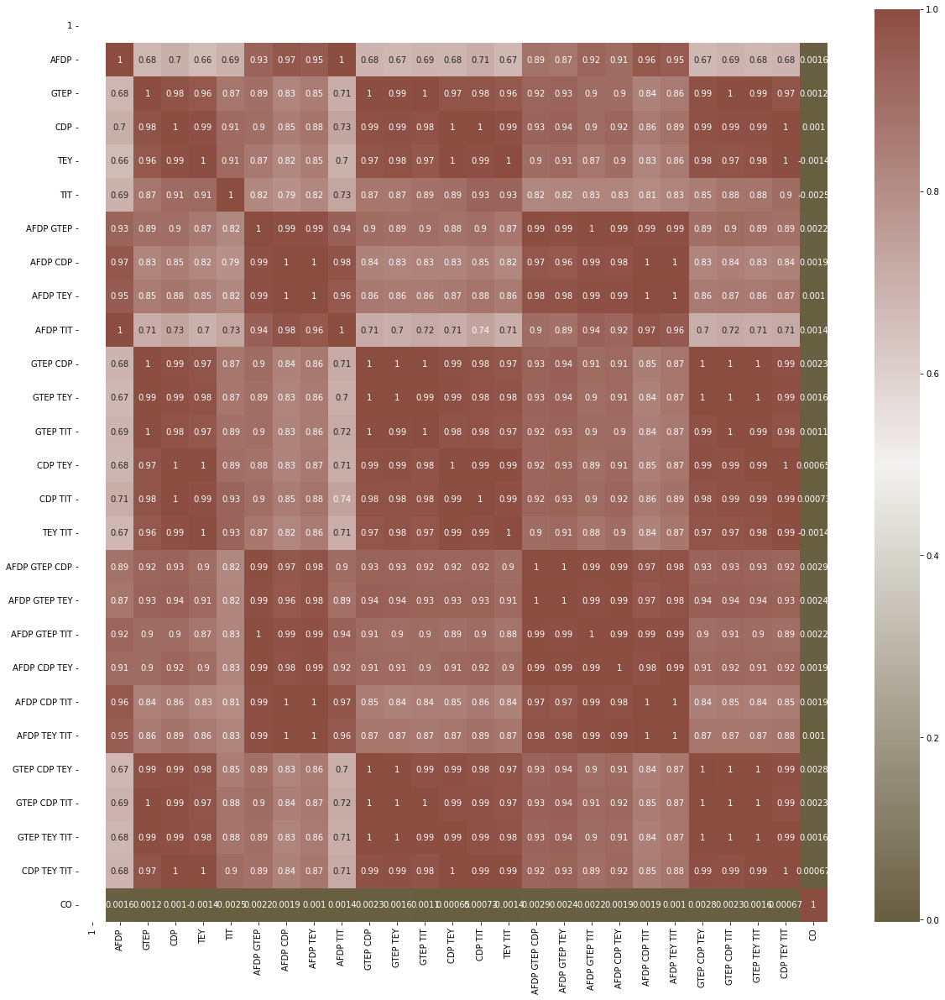

In [368]:
top_poly_features(frame_train5,co_train5,"CO")

Top 5 Features  ['y', 'carat x z', '1', 'x y', 'x z']


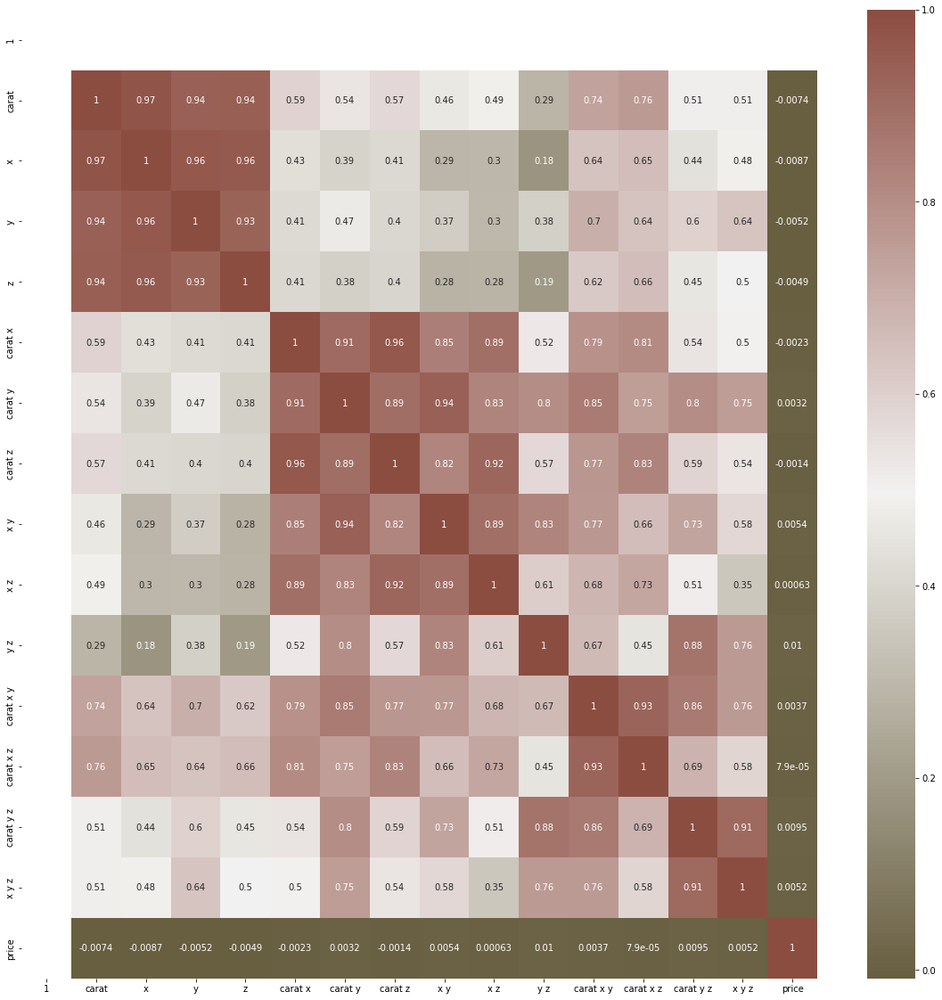

In [369]:
top_poly_features(dia_train_sc,price_train,'price')

## Neural Network

In [371]:
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler

In [ ]:
sklearn.neural_network.MLPRegressor(hidden_layer_sizes=(100,), activation='relu', *, solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)

In [372]:
# build the NN model 


pipeline_mlp=Pipeline([("scalar",StandardScaler()),
                     ("MLPRegression",MLPRegressor())])


# List of all the pipelines
pipelines_mlp = [pipeline_mlp]

# Dictionary of pipelines and model types for ease of reference
pipe_dict = {0: "MLPRegression"}

In [375]:
# Fit the pipelines
for pipe in pipelines_mlp:
    pipe.fit(frame_train5_sc, co_train5)
    
cv_results_rms = []
for i, model in enumerate(pipelines_mlp):
    cv_score = cross_val_score(model, frame_train5_sc,co_train5,scoring="neg_root_mean_squared_error", cv=10)
    cv_results_rms.append(cv_score)
    print("%s: %f " % (pipe_dict[i], cv_score.mean()))

MLPRegression: -1.254658 


In [374]:
def performance_eval_test(model,model_name,X_test,y_test):
    # Model prediction on test data
    pred = model.predict(X_test)
    print('Performance of ' + model_name)
    print("R^2:",metrics.r2_score(y_test, pred))
    print("Adjusted R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
    print("MAE:",metrics.mean_absolute_error(y_test, pred))
    print("MSE:",metrics.mean_squared_error(y_test, pred))
    print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred)))
    print('-' * 30)

In [377]:
clf_default = MLPRegressor()
clf1 = MLPRegressor(hidden_layer_sizes=(100,3), activation='relu',random_state=1, alpha=0.001, batch_size='auto', max_iter=300)
clf2 = MLPRegressor(hidden_layer_sizes=(100,5), activation='relu',random_state=1, alpha=0.001, batch_size='auto', max_iter=300)
clf3 = MLPRegressor(hidden_layer_sizes=(300,3), activation='relu',random_state=1, alpha=0.001, batch_size='auto', max_iter=300)
clf4 = MLPRegressor(hidden_layer_sizes=(300,5), activation='relu',random_state=1, alpha=0.001, batch_size='auto', max_iter=300)

In [378]:
# List of all the pipelines
pipeline_mlp0=Pipeline([("scalar",StandardScaler()),
                     ("MLP_default",clf_default)])
pipeline_mlp1=Pipeline([("scalar",StandardScaler()),
                     ("MLP1",clf1)])
pipeline_mlp2=Pipeline([("scalar",StandardScaler()),
                     ("MLP2",clf2)])
pipeline_mlp3=Pipeline([("scalar",StandardScaler()),
                     ("MLP2",clf3)])
pipeline_mlp4=Pipeline([("scalar",StandardScaler()),
                     ("MLP2",clf4)])

pipelines_mlps = [pipeline_mlp,pipeline_mlp1,pipeline_mlp2,pipeline_mlp3,pipeline_mlp4]
pipelines_mlps_test = [pipeline_mlp,pipeline_mlp1]
# Dictionary of pipelines and model types for ease of reference
pipe_mlps_dict = {0: "MLP_default",1:"MLP1",2:"MLP2",3:"MLP3",4:"MLP4"}

In [386]:
# Fit the pipelines
for pipe in pipelines_mlps:
    pipe.fit(frame_train5_sc, co_train5)

In [383]:
# Fit the pipelines
for pipe in pipelines_mlps_test:
    pipe.fit(frame_train5_sc, co_train5)
    
cv_results_rms = []
for i, model in enumerate(pipelines_mlps):
    cv_score = cross_val_score(model, frame_train5_sc,co_train5,scoring="neg_root_mean_squared_error", cv=10)
    cv_results_rms.append(cv_score)
    print("%s: %f " % (pipe_mlps_dict[i], np.absolute(cv_score).mean()))

MLP_default: 1.253635 
MLP1: 1.231044 
MLP2: 1.229830 
MLP3: 1.224570 
MLP4: 1.231274 


In [387]:
for i in range(len(pipelines_mlps)):    
    performance_eval_test(pipelines_mlps[i],pipe_mlps_dict[i],frame_test5_sc,co_test5)

Performance of MLP_default
R^2: 0.7052620310908372
Adjusted R^2: 0.7050612832574976
MAE: 0.6451852868977158
MSE: 1.603376597988437
RMSE: 1.2662450781694818
------------------------------
Performance of MLP1
R^2: 0.7334458142216305
Adjusted R^2: 0.7332642625353627
MAE: 0.622711945933981
MSE: 1.450056622004541
RMSE: 1.2041829686573968
------------------------------
Performance of MLP2
R^2: 0.7335125986468348
Adjusted R^2: 0.7333310924478476
MAE: 0.6191576150379033
MSE: 1.4496933142675734
RMSE: 1.2040321068258826
------------------------------
Performance of MLP3
R^2: 0.7496909953161777
Adjusted R^2: 0.7495205083221144
MAE: 0.6025623105433076
MSE: 1.3616827240181943
RMSE: 1.1669116179120826
------------------------------
Performance of MLP4
R^2: 0.7484173475434848
Adjusted R^2: 0.7482459930601333
MAE: 0.6187210193868752
MSE: 1.3686113767478514
RMSE: 1.1698766502276432
------------------------------


## Bayesian Optimization: LightGBM and CatBoost 

In [66]:
import lightgbm as lgb 
import pprint
from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

### LightGBM

In [42]:
X_train, X_test, y_train, y_test = train_test_split(frame_standardized[num_feature_and_cat_columns], frame_standardized['CO'], test_size=0.3,random_state=42)

train_lgb = lgb.Dataset(X_train, y_train)
eval_lgb = lgb.Dataset(X_test, y_test, reference = train_lgb)


In [ ]:
params = { 'objective': 'regression',
  'metric': 'RMSE',
  'learning_rate': 0.02}
lgb_reg = lgb.train(params, train_lgb, num_boost_round = 10000, early_stopping_rounds=50, verbose_eval = 100, valid_sets=eval_lgb)

In [56]:
# Reporting util for different optimizers
def report_perf(optimizer, X, y, title="model", callbacks=None):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    
    if callbacks is not None:
        optimizer.fit(X, y, callback=callbacks)
    else:
        optimizer.fit(X, y)
        
    d=pd.DataFrame(optimizer.cv_results_)
    best_score = optimizer.best_score_
    best_score_std = d.iloc[optimizer.best_index_].std_test_score
    best_params = optimizer.best_params_
    
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           + u"\u00B1"+" %.3f") % (time() - start, 
                                   len(optimizer.cv_results_['params']),
                                   best_score,
                                   best_score_std))    
    print('Best parameters:')
    pprint.pprint(best_params)
    print()

In [57]:
# rmse = mean_squared_error(squared=False)
# roc_auc = make_scorer(roc_auc_score, greater_is_better=True, needs_threshold=True)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
lgbregr = lgb.LGBMRegressor(boosting_type='gbdt',
                         metric='root_mean_squared_error',
                         n_jobs=1, 
                         verbose=-1,
                         random_state=42)

In [58]:
search_spaces = {
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),     # Boosting learning rate
    'n_estimators': Integer(30, 5000),                   # Number of boosted trees to fit
    'num_leaves': Integer(2, 512),                       # Maximum tree leaves for base learners
    'max_depth': Integer(-1, 256),                       # Maximum tree depth for base learners, <=0 means no limit
    'min_child_samples': Integer(1, 256),                # Minimal number of data in one leaf
    'max_bin': Integer(100, 1000),                       # Max number of bins that feature values will be bucketed
    'subsample': Real(0.01, 1.0, 'uniform'),             # Subsample ratio of the training instance
    'subsample_freq': Integer(0, 10),                    # Frequency of subsample, <=0 means no enable
    'colsample_bytree': Real(0.01, 1.0, 'uniform'),      # Subsample ratio of columns when constructing each tree
    'min_child_weight': Real(0.01, 10.0, 'uniform'),     # Minimum sum of instance weight (hessian) needed in a child (leaf)
    'reg_lambda': Real(1e-9, 100.0, 'log-uniform'),      # L2 regularization
    'reg_alpha': Real(1e-9, 100.0, 'log-uniform'),       # L1 regularization
    'scale_pos_weight': Real(1.0, 500.0, 'uniform'),     # Weighting of the minority class (Only for binary classification)
        }

In [59]:
opt_lgb = BayesSearchCV(estimator=lgbregr,                                    
                    search_spaces=search_spaces,                      
                    scoring='neg_root_mean_squared_error',                                  
                    cv=5,                                           
                    n_iter=3000,                                      # max number of trials
                    n_points=3,                                       # number of hyperparameter sets evaluated at the same time
                    n_jobs=-1,                                        # number of jobs
                    iid=False,                                        # if not iid it optimizes on the cv score
                    return_train_score=False,                         
                    refit=False,                                      
                    optimizer_kwargs={'base_estimator': 'GP'},        # optmizer parameters: we use Gaussian Process (GP)
                    random_state=0)                                   # random state for replicability


/home/anw/ucla_coursework/219/code/ECE219_data_mining_project/env219/lib/python3.8/site-packages/skopt/searchcv.py:300: UserWarning: The `iid` parameter has been deprecated and will be ignored.
  warnings.warn("The `iid` parameter has been deprecated "


In [60]:
X = 
y = frame_standardized['CO']

In [75]:
overdone_control = DeltaYStopper(delta=0.0001)               # We stop if the gain of the optimization becomes too small
time_limit_control = DeadlineStopper(total_time=60 * 45)     # We impose a time limit (45 minutes)

best_params = report_perf(opt_lgb, X, y,'LightGBM', 
                          callbacks=[overdone_control, time_limit_control])

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

### Catboost 

In [61]:
import catboost as cb

In [62]:
catboostregr = cb.CatBoostRegressor(loss_function='RMSE',cat_features=['year_cat'])

In [63]:
search_spaces_cb = {'iterations': Integer(10, 1000),
                    'depth': Integer(1, 8),
                    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
                    'random_strength': Real(1e-9, 10, 'log-uniform'),
                    'bagging_temperature': Real(0.0, 1.0),
                    'border_count': Integer(1, 255),
                    'l2_leaf_reg': Integer(2, 30)}#,
                    # 'scale_pos_weight':Real(0.01, 1.0, 'uniform')}

In [64]:
opt_cb = BayesSearchCV(estimator=catboostregr,                                    
                    search_spaces=search_spaces_cb,                      
                    scoring='neg_root_mean_squared_error',                                  
                    cv=5,                                           
                    n_iter=3000,                                      # max number of trials
                    n_points=3,                                       # number of hyperparameter sets evaluated at the same time
                    n_jobs=1,                                        # number of jobs
                    iid=False,                                        # if not iid it optimizes on the cv score
                    return_train_score=False,                         
                    refit=False,                                      
                    optimizer_kwargs={'base_estimator': 'GP'},        # optmizer parameters: we use Gaussian Process (GP)
                    random_state=42)                                   # random state for replicability


/home/anw/ucla_coursework/219/code/ECE219_data_mining_project/env219/lib/python3.8/site-packages/skopt/searchcv.py:300: UserWarning: The `iid` parameter has been deprecated and will be ignored.
  warnings.warn("The `iid` parameter has been deprecated "


In [67]:
overdone_control = DeltaYStopper(delta=0.0001)               # We stop if the gain of the optimization becomes too small
time_limit_control = DeadlineStopper(total_time=60 * 10)     # We impose a time limit (45 minutes)

best_params = report_perf(opt_cb, X, y,'CatBoost', 
                          callbacks=[overdone_control, time_limit_control])

0:	learn: 2.1431761	total: 11.2ms	remaining: 3.61s
1:	learn: 2.0668960	total: 21.7ms	remaining: 3.49s
2:	learn: 1.9944907	total: 32ms	remaining: 3.42s
3:	learn: 1.9303368	total: 42.9ms	remaining: 3.42s
4:	learn: 1.8709275	total: 54.4ms	remaining: 3.46s
5:	learn: 1.8153726	total: 64.9ms	remaining: 3.43s
6:	learn: 1.7638692	total: 73.6ms	remaining: 3.32s
7:	learn: 1.7152967	total: 80.8ms	remaining: 3.18s
8:	learn: 1.6723920	total: 90.4ms	remaining: 3.15s
9:	learn: 1.6305532	total: 97.9ms	remaining: 3.06s
10:	learn: 1.5913535	total: 106ms	remaining: 3.01s
11:	learn: 1.5586847	total: 114ms	remaining: 2.96s
12:	learn: 1.5273990	total: 125ms	remaining: 2.97s
13:	learn: 1.4982501	total: 134ms	remaining: 2.96s
14:	learn: 1.4714692	total: 142ms	remaining: 2.91s
15:	learn: 1.4465836	total: 150ms	remaining: 2.87s
16:	learn: 1.4236844	total: 159ms	remaining: 2.85s
17:	learn: 1.4018467	total: 167ms	remaining: 2.83s
18:	learn: 1.3816906	total: 176ms	remaining: 2.81s
19:	learn: 1.3629632	total: 184ms